# **Stock Prices, ESG score and Reddit posts**

In [1180]:
import pandas as pd

In [1181]:
df_stock= pd.read_csv('/content/drive/MyDrive/Microsoft Stock Prices.csv')
df_stock.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,1980-12-02,0.179688,0.183594,0.179688,0.179688,0.000004,100710400
1,1980-12-03,0.177734,0.177734,0.175781,0.175781,0.000004,25177600
2,1980-12-04,0.181641,0.183594,0.181641,0.181641,0.000004,22694400
3,1980-12-05,0.175781,0.175781,0.171875,0.171875,0.000004,7590400
4,1980-12-08,0.164063,0.164063,0.162109,0.162109,0.000003,5414400


#Editing the esg dataset

In [1182]:
import numpy as np
import pandas as pd
import json
import matplotlib.pyplot as plt
import seaborn as sns

In [1183]:

with open('/content/drive/MyDrive/esg.json', 'r') as json_file:
    esg_data = json.load(json_file)

result_data = esg_data['esgChart']['result']
data = []

for item in result_data:
    peer_group = item['peerGroup']
    symbol_series = item['symbolSeries']
    timestamps = symbol_series['timestamp']
    esg_scores = symbol_series['esgScore']
    governance_scores = symbol_series['governanceScore']
    environment_scores = symbol_series['environmentScore']
    social_scores = symbol_series['socialScore']

    for i in range(len(timestamps)):
        flat_item = {
            'peerGroup': peer_group,
            'timestamp': timestamps[i],
            'esgScore': esg_scores[i],
            'governanceScore': governance_scores[i],
            'environmentScore': environment_scores[i],
            'socialScore': social_scores[i]
        }
        data.append(flat_item)

df = pd.DataFrame(data)

df.to_csv('esg_dataset.csv', index=False)


In [1184]:
df

,peerGroup,timestamp,esgScore,governanceScore,environmentScore,socialScore
0,Software & Services,1409529600,66.00,63.00,78.00,59.00
1,Software & Services,1412121600,66.00,63.00,78.00,59.00
2,Software & Services,1414800000,66.00,63.00,78.00,59.00
3,Software & Services,1417392000,66.00,63.00,78.00,59.00
4,Software & Services,1420070400,66.00,63.00,78.00,59.00
...,...,...,...,...,...,...
91,Software & Services,1648771200,NaN,NaN,NaN,NaN
92,Software & Services,1651363200,13.75,5.23,0.46,8.06
93,Software & Services,1654041600,NaN,NaN,NaN,NaN
94,Software & Services,1656633600,NaN,NaN,NaN,NaN


In [1185]:
df['timestamp'] = pd.to_datetime(df['timestamp'], unit='s')



In [1186]:
start_date = pd.Timestamp('2020-01-01')
end_date = pd.Timestamp('2023-08-25')

mask = (df['timestamp'] >= start_date) & (df['timestamp'] <= end_date)
df = df[mask]
df.reset_index(drop=True, inplace=True)

In [1187]:
df['date'] = df['timestamp'].dt.strftime('%m-%d-%Y')

<ipython-input-1187-a238f174c1d5>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [1188]:

df.drop('timestamp', axis=1, inplace=True)
df.head()

<ipython-input-1188-2daecfdde8b9>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,peerGroup,esgScore,governanceScore,environmentScore,socialScore,date
0,Software & Services,15.35,5.19,0.44,9.71,01-01-2020
1,Software & Services,15.35,5.19,0.44,9.71,02-01-2020
2,Software & Services,15.55,5.24,0.44,9.87,03-01-2020
3,Software & Services,NaN,NaN,NaN,NaN,04-01-2020
4,Software & Services,NaN,NaN,NaN,NaN,05-01-2020


In [1189]:
df = df.dropna()
df.dropna(inplace=True)
df.isnull().sum()


peerGroup           0
esgScore            0
governanceScore     0
environmentScore    0
socialScore         0
date                0
dtype: int64

In [1191]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14 entries, 0 to 31
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   peerGroup         14 non-null     object 
 1   esgScore          14 non-null     float64
 2   governanceScore   14 non-null     float64
 3   environmentScore  14 non-null     float64
 4   socialScore       14 non-null     float64
 5   date              14 non-null     object 
dtypes: float64(4), object(2)
memory usage: 784.0+ bytes


In [1192]:
df.dtypes

peerGroup            object
esgScore            float64
governanceScore     float64
environmentScore    float64
socialScore         float64
date                 object
dtype: object

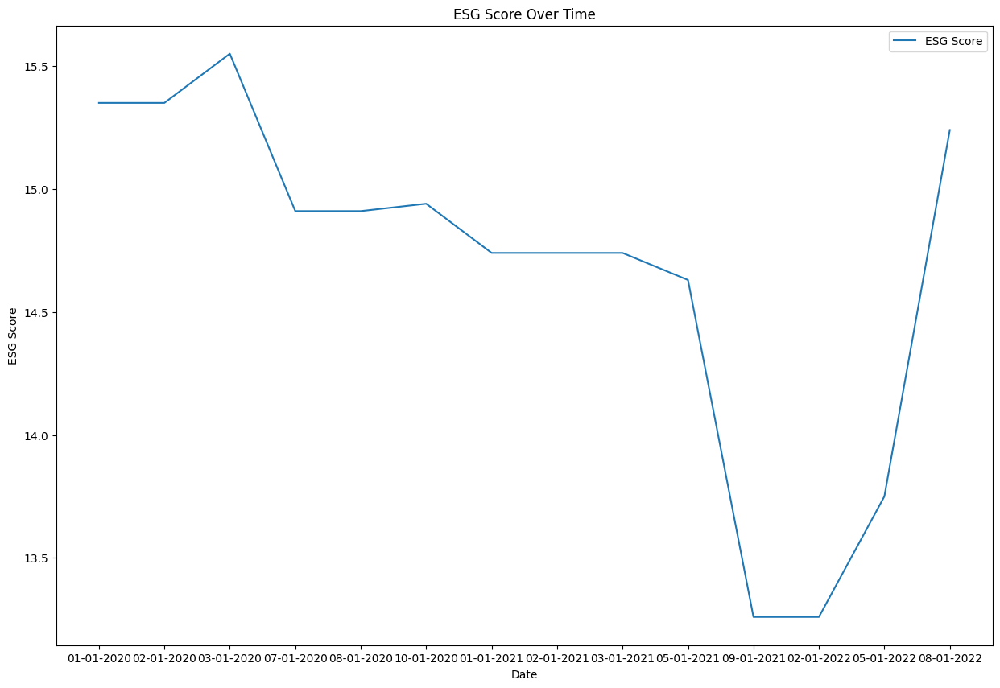

In [1193]:
#Plotting esg score
plt.figure(figsize=(15, 10))
plt.plot(df['date'], df['esgScore'], label='ESG Score')
plt.xlabel('Date')
plt.ylabel('ESG Score')
plt.title('ESG Score Over Time')
plt.legend()
plt.show()

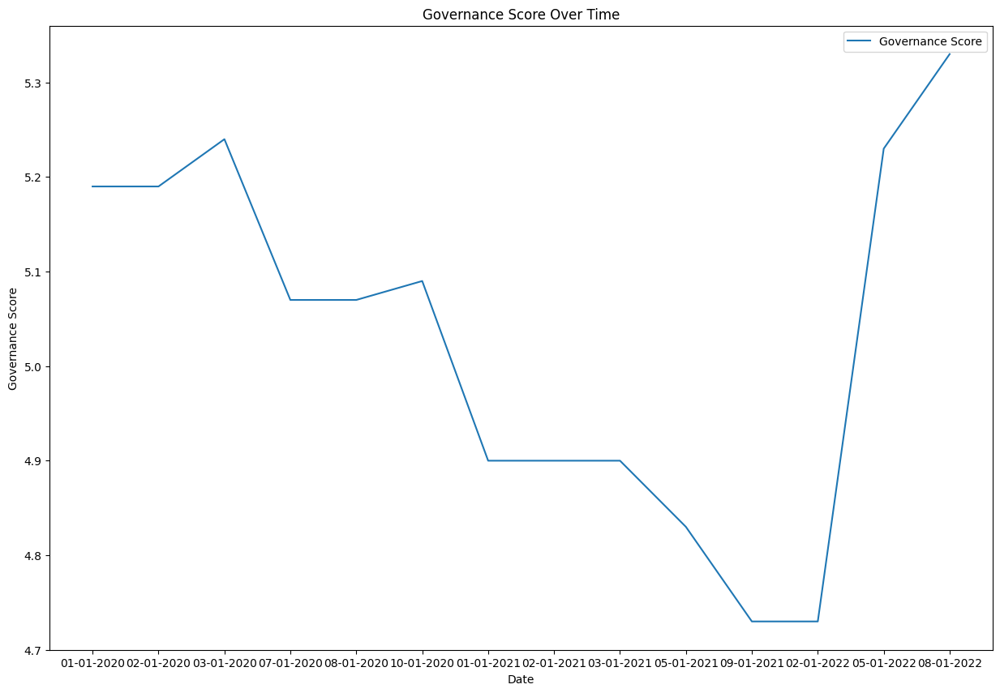

In [1194]:
#Plotting governance score
plt.figure(figsize=(15, 10))
plt.plot(df['date'], df['governanceScore'], label='Governance Score')
plt.xlabel('Date')
plt.ylabel('Governance Score')
plt.title('Governance Score Over Time')
plt.legend()
plt.show()

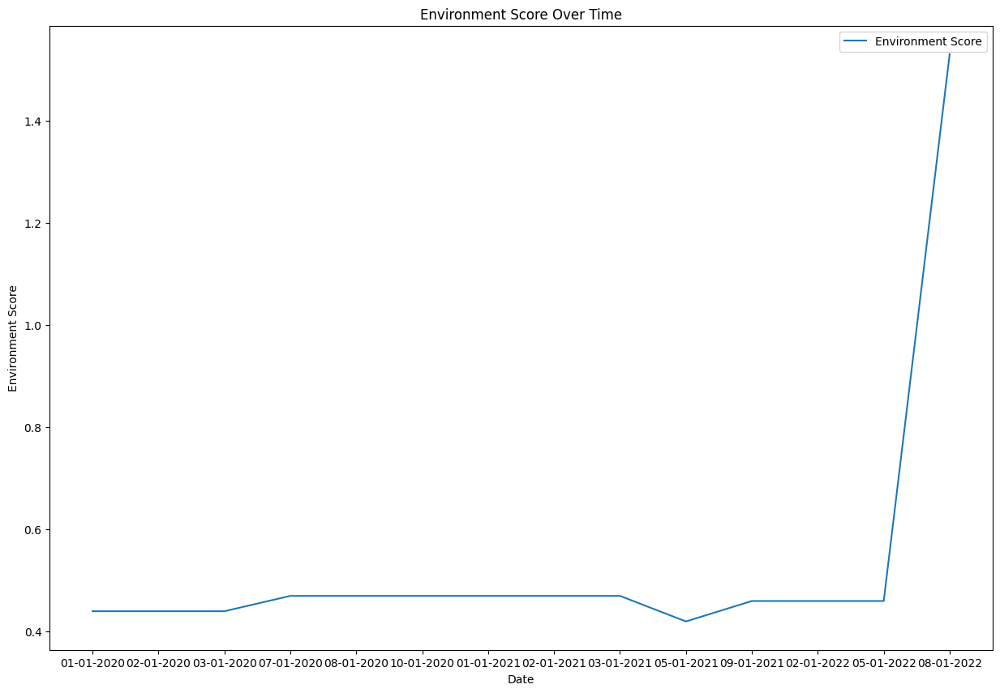

In [1195]:
#Plotting environment score
plt.figure(figsize=(15, 10))
plt.plot(df['date'], df['environmentScore'], label='Environment Score')
plt.xlabel('Date')
plt.ylabel('Environment Score')
plt.title('Environment Score Over Time')
plt.legend()
plt.show()

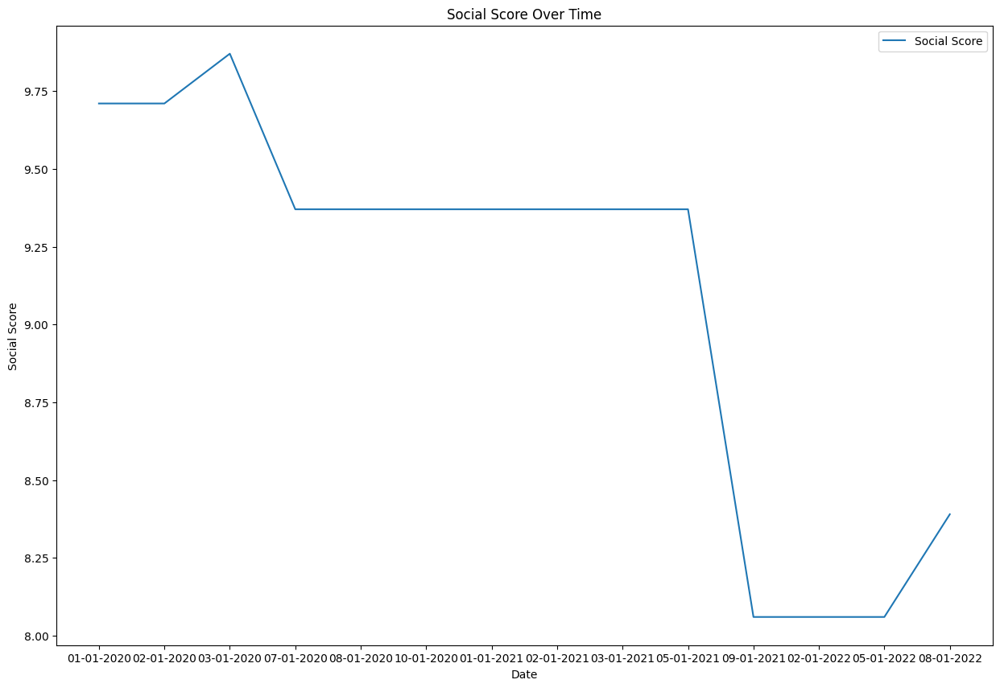

In [1196]:
#Plotting social score
plt.figure(figsize=(15, 10))
plt.plot(df['date'], df['socialScore'], label='Social Score')
plt.xlabel('Date')
plt.ylabel('Social Score')
plt.title('Social Score Over Time')
plt.legend()
plt.show()

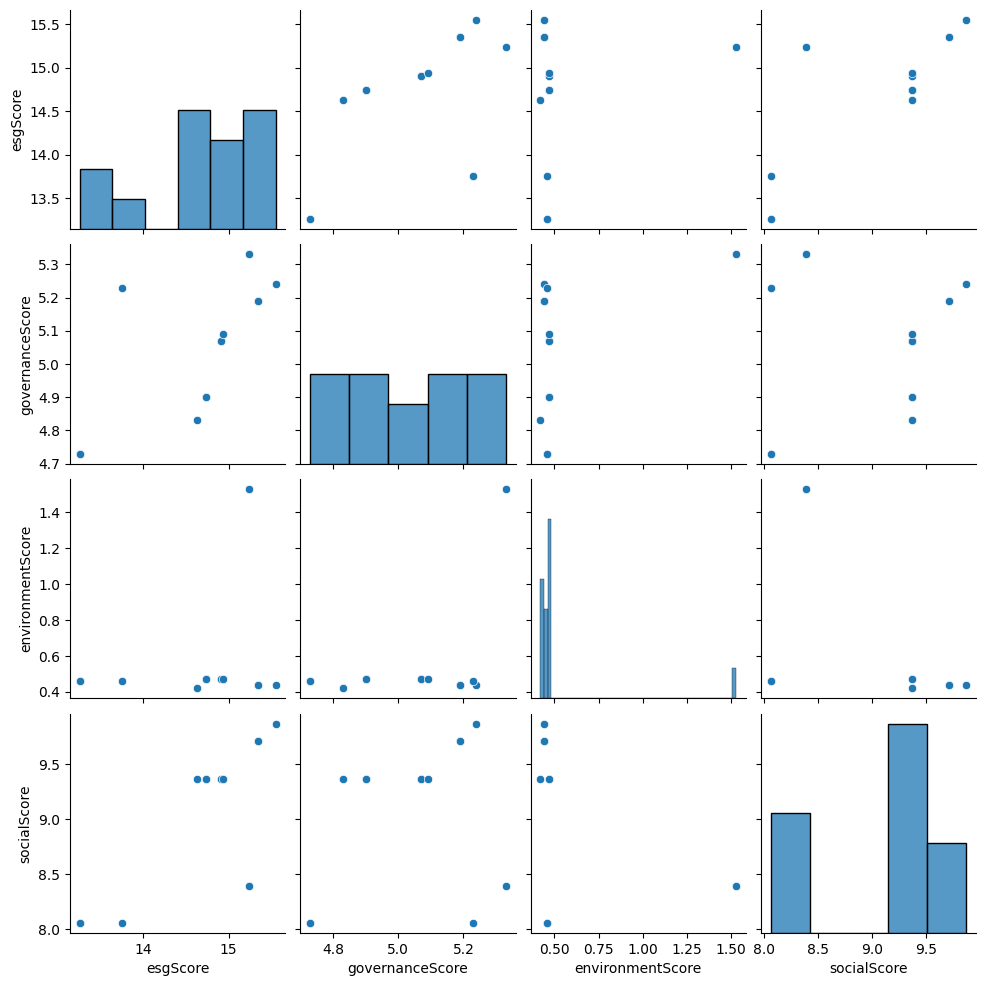

In [1197]:
sns.pairplot(df)

In [1198]:
esg_statistics=df.describe()
esg_statistics

,esgScore,governanceScore,environmentScore,socialScore
count,14.000000,14.000000,14.000000,14.000000
mean,14.669286,5.028571,0.533571,9.103571
std,0.736473,0.196659,0.287231,0.656103
min,13.260000,4.730000,0.420000,8.060000
25%,14.657500,4.900000,0.445000,8.635000
50%,14.825000,5.070000,0.465000,9.370000
75%,15.165000,5.190000,0.470000,9.370000
max,15.550000,5.330000,1.530000,9.870000


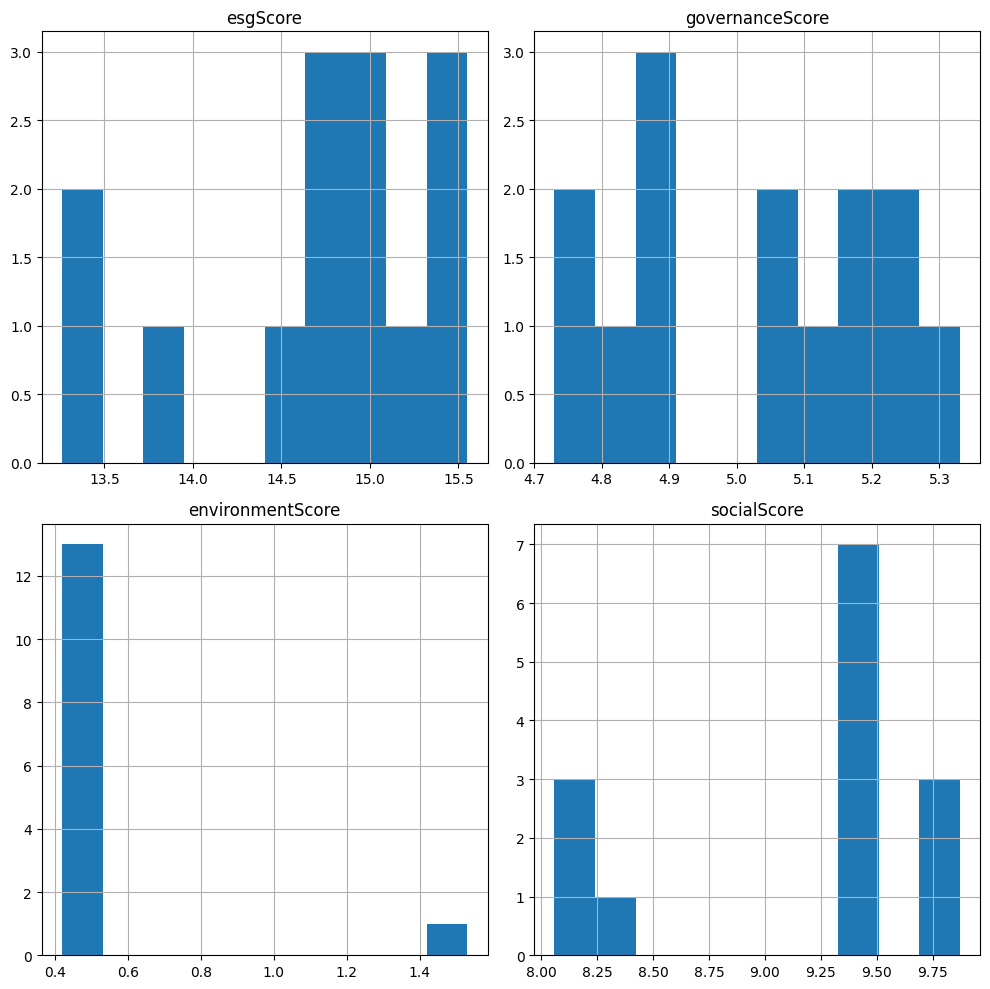

In [1199]:
df.hist(figsize=(10, 10))
plt.tight_layout()
plt.show()

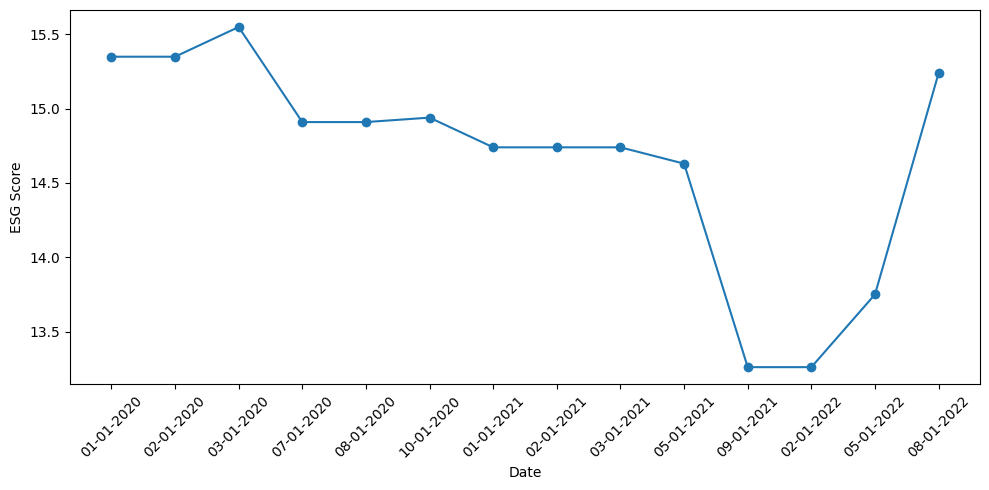

In [1200]:
plt.figure(figsize=(10, 5))
plt.plot(df['date'], df['esgScore'], marker='o')
plt.xlabel('Date')
plt.ylabel('ESG Score')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

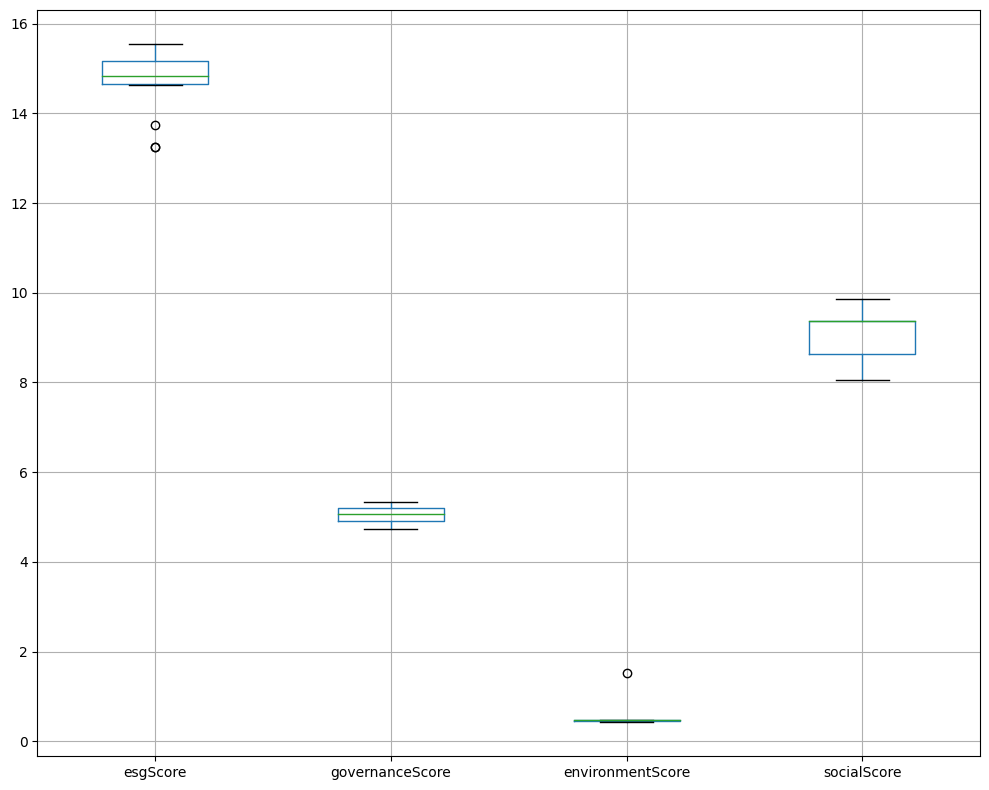

In [1201]:
df.boxplot(figsize=(10, 8))
plt.tight_layout()
plt.show()

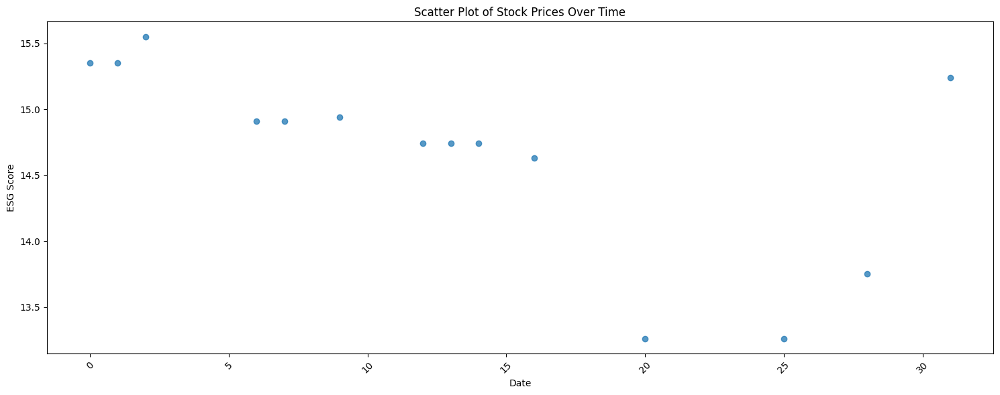

In [1202]:
fig = plt.figure(figsize=(15, 6))
plt.scatter(df.index, df['esgScore'], alpha=0.75)
plt.xlabel('Date')
plt.ylabel('ESG Score')
plt.title('Scatter Plot of Stock Prices Over Time')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

<ipython-input-1203-9b639283758b>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



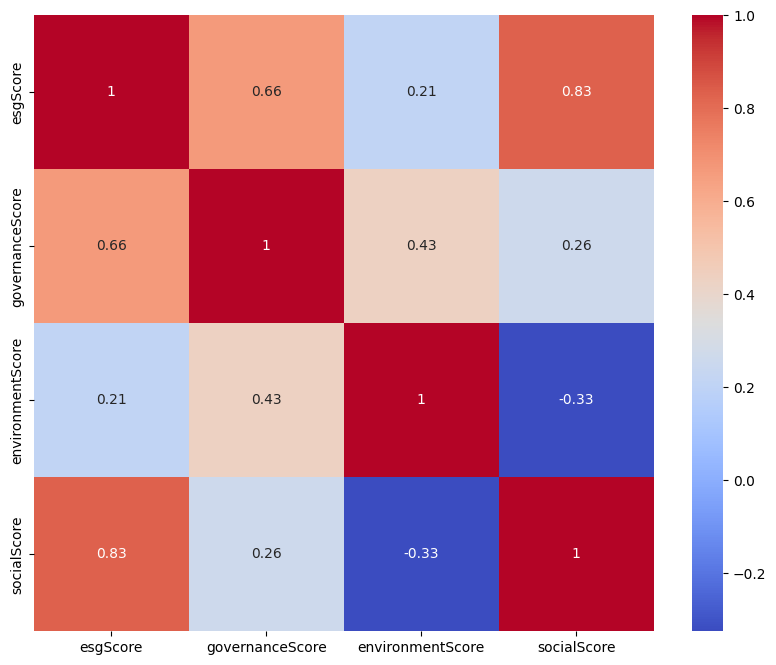

In [1203]:
correlation_matrix = df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

In [1204]:
df.to_csv('/content/drive/MyDrive/df_esg.csv', index=False)

In [1205]:
df.to_csv('/content/drive/MyDrive/df_esg.csv', index=False)

In [1206]:
df_esg= pd.read_csv('//content/drive/MyDrive/df_esg.csv')
df_esg['Date'] = df_esg['date']
df_esg.drop(columns=['date'], inplace=True)
df_esg.head()

,peerGroup,esgScore,governanceScore,environmentScore,socialScore,Date
0,Software & Services,15.35,5.19,0.44,9.71,01-01-2020
1,Software & Services,15.35,5.19,0.44,9.71,02-01-2020
2,Software & Services,15.55,5.24,0.44,9.87,03-01-2020
3,Software & Services,14.91,5.07,0.47,9.37,07-01-2020
4,Software & Services,14.91,5.07,0.47,9.37,08-01-2020


#Editing the reddit post dataset and doing a sentiment analysis

# **Reddit posts scraping and sentiment analysis**

In [1264]:
import pandas as pd

reddit_df = pd.read_csv('/content/drive/MyDrive/reddit_data.csv')

reddit_df


,Title,Content,Time
0,Microsoft should be sued for how poorly their ...,Just activated a Sea of Thieves key in the sto...,1.692915e+09
1,New laptop search question,I’m looking to replace my Dell laptop (that cr...,1.692900e+09
2,Visual Studio .Net Professional 2003 60 day tr...,I have this copy of Visual Studio. Net 2003 Pr...,1.692899e+09
3,A worrisome folder creation on my OneDrive,An empty folder named 문서 was created without m...,1.692896e+09
4,Is there a way to delete my Xbox account?,I was trying to change my email on an old Xbox...,1.692893e+09
...,...,...,...
900,My keyboard doesn’t work,My Lenovo MIIX-310-10ICR detachable keyboard w...,1.687740e+09
901,PDF Tools App is no longer offered in Microsof...,Microsoft Office 365 & Teams will no longer of...,1.687735e+09
902,Cyberpunk 2077 DLC bundle pre-order not instal...,\n\nI have purchased the Cyberpunk 2077 DLC bu...,1.687730e+09
903,Xbox APP Capped at 5 mbps download speed!!!!! ...,I have been trying to figure out how to fix t...,1.687725e+09


In [1208]:
reddit_df['Content'] = reddit_df['Content'].fillna('')


In [1209]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [1210]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sid = SentimentIntensityAnalyzer()

In [1211]:
def get_sentiment_category(compound_score, threshold=0.05):
    if compound_score >= threshold:
        return 1
    elif compound_score <= -threshold:
        return -1
    else:
        return 0

In [1212]:
def analyze_sentiment(Content):
    sentiment_scores = sid.polarity_scores(Content)
    compound_score = sentiment_scores['compound']
    return get_sentiment_category(compound_score)


reddit_df['Sentiment'] = reddit_df['Content'].apply(analyze_sentiment)

In [1213]:
reddit_df


,Title,Content,Time,Sentiment
0,Good God how the hell do I fix this scaling th...,How can I fix this because it’s so fuckin anno...,2023-08-30 10:02:00,-1
1,MS Store for business?,"Hey there,\n\n&#x200B;\n\nanyone knows if the ...",2023-08-30 09:52:12,0
2,Is it just me? Endless Microsoft single-use co...,I must get about 5-10 “Your single-use code re...,2023-08-30 08:44:59,-1
3,Help with deleted files still showing in recen...,"So I had a bunch of files that I have deleted,...",2023-08-30 04:39:12,1
4,Separate themes,How to separate my outlook and word themes?\nI...,2023-08-30 03:49:33,-1
...,...,...,...,...
906,Mail and Calendar app is gone,"I use the app daily, couple days ago I saw the...",2023-07-04 12:04:12,-1
907,What is the best free music player (for local ...,"After Microsoft changed ""Groove Music"" into ""M...",2023-07-04 09:26:12,1
908,Movies an tv on discord,Is it possible to stream Movies an Tv on disco...,2023-07-04 07:41:17,1
909,They should use AI to figure out how to rename...,Everyone loves the convenience of calling a fi...,2023-07-04 07:39:22,-1


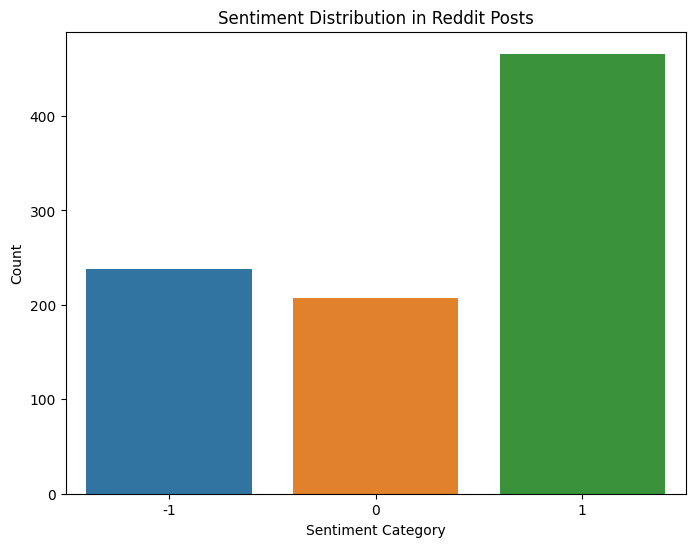

In [1214]:
import matplotlib.pyplot as plt
import seaborn as sns

# Sentiment Distribution
plt.figure(figsize=(8, 6))
sns.countplot(x='Sentiment', data=reddit_df)
plt.title('Sentiment Distribution in Reddit Posts')
plt.xlabel('Sentiment Category')
plt.ylabel('Count')
plt.show()

In [1215]:
reddit_df['Date'] = pd.to_datetime(reddit_df['Time']).dt.date


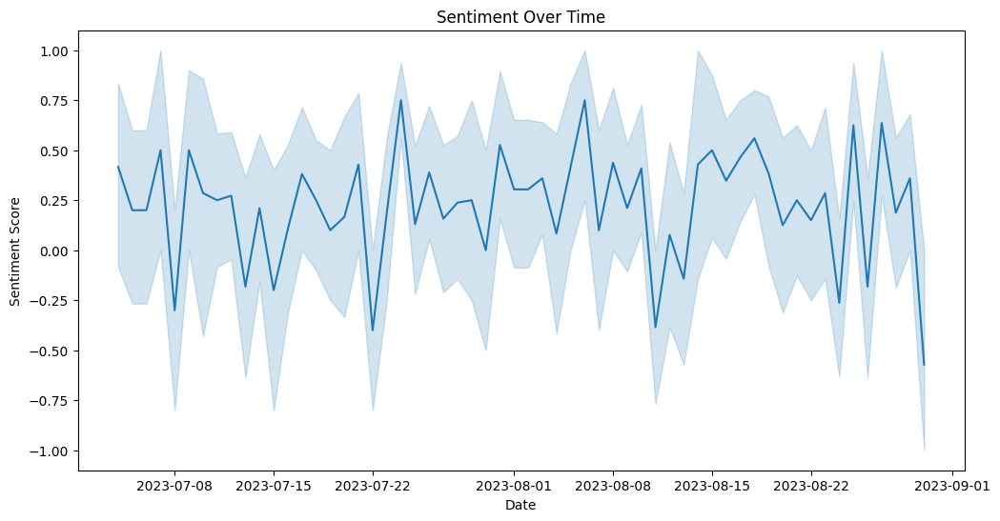

In [1216]:
# Sentiment Over Time
plt.figure(figsize=(12, 6))
reddit_df['Date'] = pd.to_datetime(reddit_df['Date'])
sns.lineplot(x='Date', y='Sentiment', data=reddit_df)
plt.title('Sentiment Over Time')
plt.xlabel('Date')
plt.ylabel('Sentiment Score')
plt.show()

(-0.5, 799.5, 399.5, -0.5)

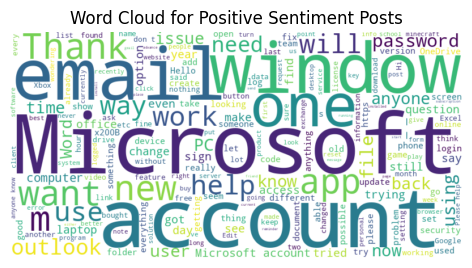

In [1217]:
from wordcloud import WordCloud


positive_posts = ' '.join(reddit_df[reddit_df['Sentiment'] == 1]['Content'])
neutral_posts = ' '.join(reddit_df[reddit_df['Sentiment'] == 0]['Content'])
negative_posts = ' '.join(reddit_df[reddit_df['Sentiment'] == -1]['Content'])

plt.figure(figsize=(15, 10))

plt.subplot(3, 1, 1)
wordcloud_positive = WordCloud(width=800, height=400, background_color='white').generate(positive_posts)
plt.imshow(wordcloud_positive, interpolation='bilinear')
plt.title('Word Cloud for Positive Sentiment Posts')
plt.axis('off')

(-0.5, 799.5, 399.5, -0.5)

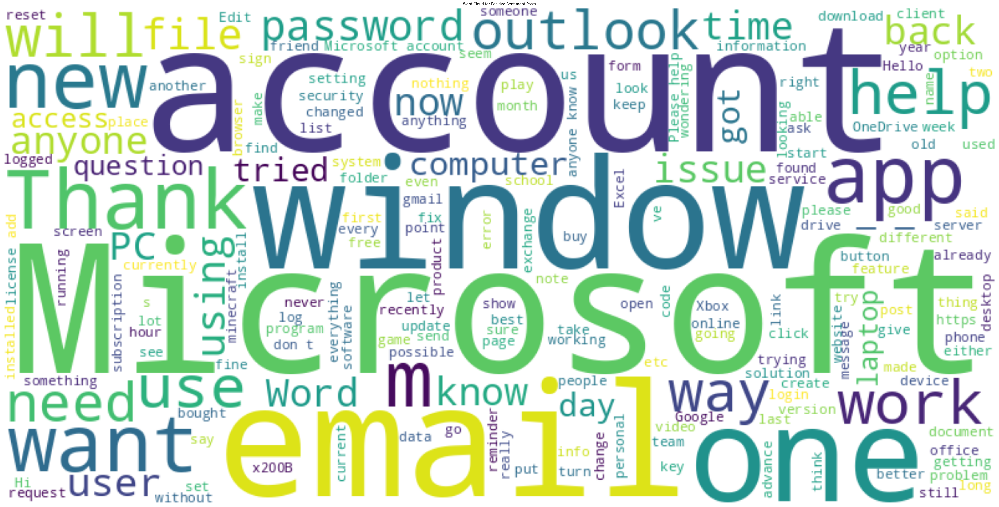

In [1218]:
plt.subplot(3, 1, 1)
wordcloud_positive = WordCloud(width=800, height=400, background_color='white').generate(positive_posts)
plt.imshow(wordcloud_positive, interpolation='bilinear')
plt.title('Word Cloud for Positive Sentiment Posts')
plt.axis('off')

(-0.5, 799.5, 399.5, -0.5)

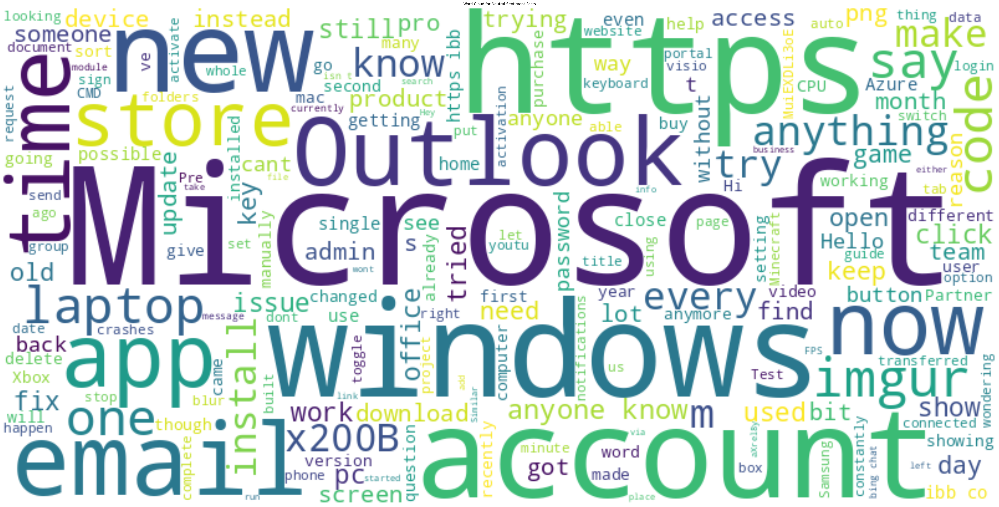

In [1219]:
plt.subplot(3, 1, 2)
wordcloud_neutral = WordCloud(width=800, height=400, background_color='white').generate(neutral_posts)
plt.imshow(wordcloud_neutral, interpolation='bilinear')
plt.title('Word Cloud for Neutral Sentiment Posts')
plt.axis('off')

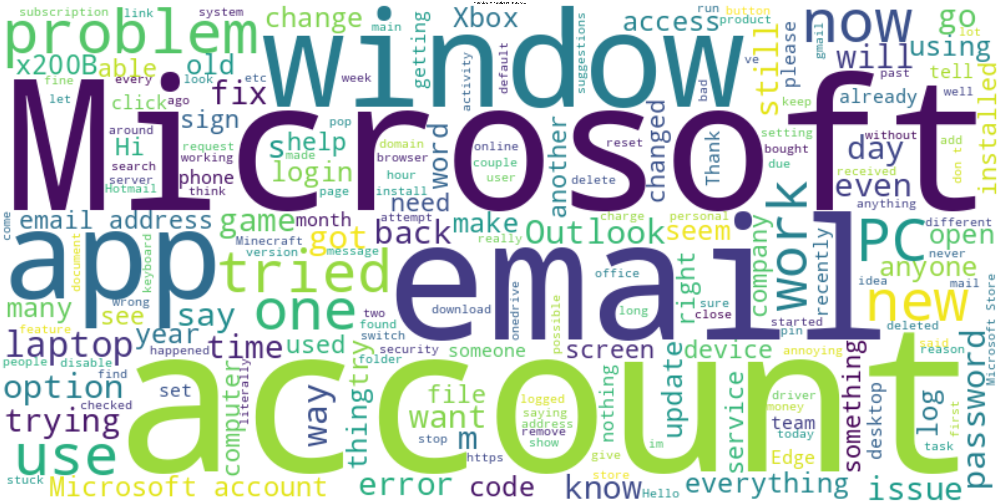

In [1220]:
plt.subplot(3, 1, 3)
wordcloud_negative = WordCloud(width=800, height=400, background_color='white').generate(negative_posts)
plt.imshow(wordcloud_negative, interpolation='bilinear')
plt.title('Word Cloud for Negative Sentiment Posts')
plt.axis('off')
plt.tight_layout()
plt.show()

In [1221]:
reddit_df.to_csv('/content/drive/MyDrive/df_reddit_sentiment.csv', index=False)

In [1222]:
df_reddit= pd.read_csv('/content/drive/MyDrive/df_reddit_sentiment.csv')
df_reddit['Date'] = pd.to_datetime(df_reddit['Time']).dt.date
df_reddit.drop(columns=['Time'], inplace=True)
df_reddit.head()

,Title,Content,Sentiment,Date
0,Good God how the hell do I fix this scaling th...,How can I fix this because it’s so fuckin anno...,-1,2023-08-30
1,MS Store for business?,"Hey there,\n\n&#x200B;\n\nanyone knows if the ...",0,2023-08-30
2,Is it just me? Endless Microsoft single-use co...,I must get about 5-10 “Your single-use code re...,-1,2023-08-30
3,Help with deleted files still showing in recen...,"So I had a bunch of files that I have deleted,...",1,2023-08-30
4,Separate themes,How to separate my outlook and word themes?\nI...,-1,2023-08-30


In [1223]:
df_stock.columns = df_stock.columns.str.strip()
df_reddit.columns = df_reddit.columns.str.strip()

In [1224]:
df_stock['Date'] = pd.to_datetime(df_stock['Date']).dt.date
df_reddit['Date'] = pd.to_datetime(df_reddit['Date']).dt.date

In [1225]:
start_date = pd.to_datetime('2020-01-01').date()
end_date = pd.to_datetime('2023-08-25').date()

In [1226]:

filtered_stock = df_stock[(df_stock['Date'] >= start_date) & (df_stock['Date'] <= end_date)]
filtered_reddit = df_reddit[(df_reddit['Date'] >= start_date) & (df_reddit['Date'] <= end_date)]

In [1227]:
merged_df = pd.merge(filtered_reddit, filtered_stock, on='Date', how='left')
merged_df.interpolate(method='linear', inplace=True)
merged_df['Content'].fillna('No Content Available', inplace=True)
merged_df['Date'] = pd.to_datetime(merged_df['Date']).astype(int)

In [1228]:
from sklearn.model_selection import train_test_split

features = ['Open', 'High', 'Low', 'Volume']
x= filtered_stock[features]
y = filtered_stock['Close']

X_train,X_test,Y_train,Y_test = train_test_split(x,y,test_size=0.2)


In [1229]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy='mean')
X_train = imputer.fit_transform(X_train)
X_test = imputer.transform(X_test)

In [1230]:
import plotly.offline as py
import plotly.graph_objs as go
import numpy as np
import seaborn as sns
%matplotlib inline

In [1232]:
X_train, Y_train = [], []
for i in range(len(train) - 3):
  a = train.iloc[i:(i + 3), 4]
  X_train.append(a)
  Y_train.append(train.iloc[i + 3, 4])
print(len(Y_train))

8608


In [1233]:
X_test, Y_test = [], []
for i in range(len(test) - 3):
  a = test.iloc[i:(i + 3), 5]
  X_test.append(a)
  Y_test.append(test.iloc[i + 3, 5])
print(len(Y_test))

2150


In [1234]:
X_train = np.array(X_train)
X_test = np.array(X_test)
Y_train = np.array(Y_train)
Y_test = np.array(Y_test)

X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))

In [1235]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM

model = Sequential()
model.add(LSTM(100,  activation='relu', return_sequences=True,input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(LSTM(50, activation='relu'))
model.add(Dense(1))

In [1236]:
model.compile(loss='mae', optimizer='adam')

In [1237]:
history = model.fit(X_train, Y_train, epochs=30, batch_size=100, validation_split=0.2, verbose=2, shuffle=False)

Epoch 1/30
69/69 - 4s - loss: 1.5404 - val_loss: 2.3066 - 4s/epoch - 64ms/step
Epoch 2/30
69/69 - 1s - loss: 2.1611 - val_loss: 5.1797 - 513ms/epoch - 7ms/step
Epoch 3/30
69/69 - 1s - loss: 0.5244 - val_loss: 1.6221 - 616ms/epoch - 9ms/step
Epoch 4/30
69/69 - 1s - loss: 0.7450 - val_loss: 0.9288 - 522ms/epoch - 8ms/step
Epoch 5/30
69/69 - 1s - loss: 0.6403 - val_loss: 1.4840 - 520ms/epoch - 8ms/step
Epoch 6/30
69/69 - 1s - loss: 0.4471 - val_loss: 2.3784 - 674ms/epoch - 10ms/step
Epoch 7/30
69/69 - 1s - loss: 0.3867 - val_loss: 2.5611 - 800ms/epoch - 12ms/step
Epoch 8/30
69/69 - 1s - loss: 0.3702 - val_loss: 2.7068 - 885ms/epoch - 13ms/step
Epoch 9/30
69/69 - 1s - loss: 0.4006 - val_loss: 2.1322 - 866ms/epoch - 13ms/step
Epoch 10/30
69/69 - 1s - loss: 0.4500 - val_loss: 1.9047 - 805ms/epoch - 12ms/step
Epoch 11/30
69/69 - 1s - loss: 0.2894 - val_loss: 1.4407 - 634ms/epoch - 9ms/step
Epoch 12/30
69/69 - 0s - loss: 0.2736 - val_loss: 1.2934 - 482ms/epoch - 7ms/step
Epoch 13/30
69/69 - 0s

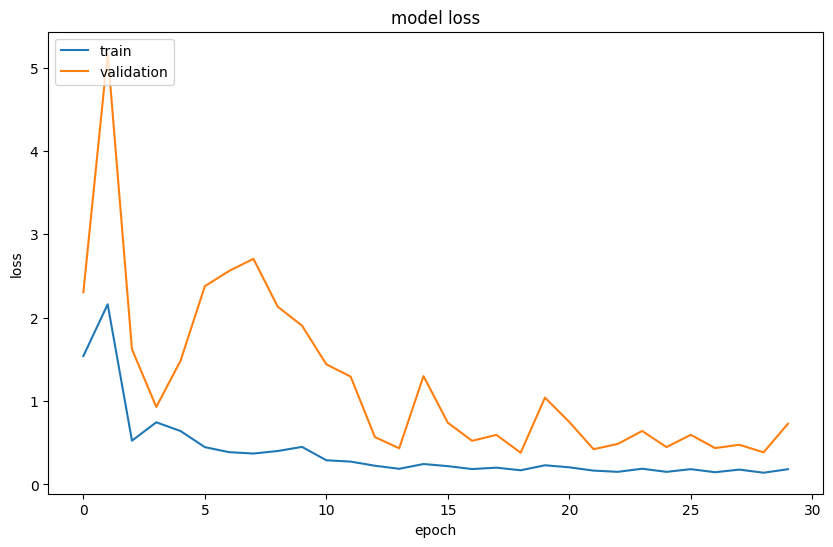

In [1238]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

68/68 [==============================] - 1s 3ms/step


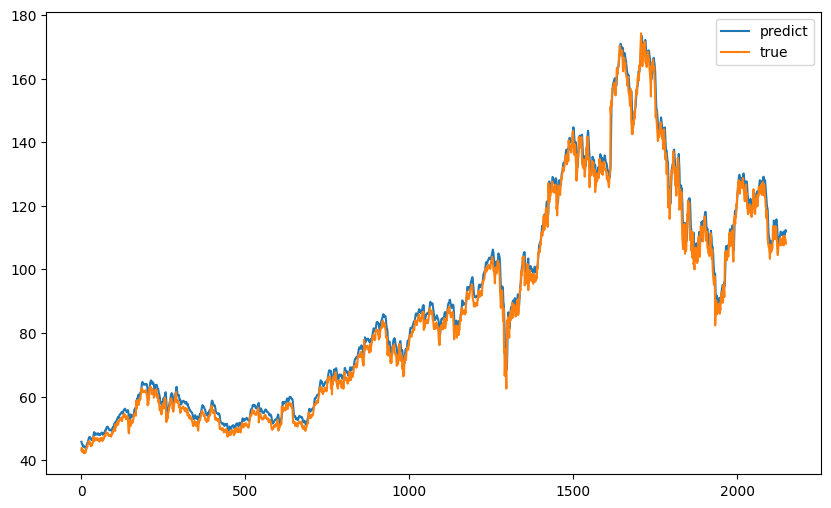

In [1239]:
plt.figure(figsize=(10, 6))
y_pred = model.predict(X_test)
plt.plot(y_pred, label='predict')
plt.plot(Y_test, label='true')
plt.legend()
plt.show()

In [1255]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

mae = mean_absolute_error(y_pred, Y_test)
print("Mean Absolute Error: " + str(mae))

Mean Absolute Error: 2.4557334467942633


In [1256]:
mse = mean_squared_error(y_pred, Y_test)
print("Mean Squared Error: " + str(mse))

Mean Squared Error: 9.32162041432434


In [1257]:
rmse = np.sqrt(mse)
print("Root Mean Squared Error: " + str(rmse))

Root Mean Squared Error: 3.0531328851401702
